# Comparison Notebook

# <u>Authors:</u>
## 1. Matthias Bartolo ID: 0436103L
## 2. Luke Cardona ID: 0011803H
## 3. Jerome Agius ID: 0353803L
## 4. Isaac Muscat ID: 0265203L



### Packages:

In [1]:
import os
import cv2
import numpy as np
from matplotlib import pyplot as plt
from IPython.display import clear_output
import math
from os import listdir

</br>

### Specifying Paths

In [2]:
#Specifying Paths
pathNamepart4 = "./Question4/images/"
pathNamepart3Pytorch = "./Question3/images/AugmentedImagesPyTorch/"
pathNamepart3Tensorflow = "./Question3/images/AugmentedImagesTensorFlow/"
mainImage = cv2.cvtColor(cv2.imread("./images/bosnia_colour.jpeg"), cv2.COLOR_BGR2RGB)
comparativeList=["Augmented Image Question 4","Original Image","Augmented Image Pytorch","Augmented Image TensorFlow"]

</br>

### Function which displays all the images in an image dictionary

In [3]:
#Function takes parameters number of rows and columns
def DisplayImages(images, rows, cols):
    #Creating a Grid, depending on the number of rows and columns
    fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(20, 10*round(rows/2))) 
    #Flattening the axes and taking the number of unwanted plots
    axes = axes.flatten()
    unwantedPlots=len(images)
    #Looping through all the images
    for i, (imageName, image) in enumerate(images.items()):
        #Checking whether exceeded list and setting the number of unwantedPlots starting value
        if i >= rows * cols:
            unwantedPlots=i
            break
        
        #Calculating row and column
        row = i // cols 
        col = i % cols
        
        #Error checking for axes keys
        if row < rows and col < cols:
            axes[i].imshow(image, interpolation='nearest', cmap='gray') #Displaying the image
            axes[i].set_title(imageName) #Setting the title
            axes[i].axis('off') #Removing the axes
    
    #Deleting the extra plots
    for i in range(unwantedPlots, len(axes)):
        fig.delaxes(axes[i])
    #Showing plot
    plt.show() 

</br>

### Function which displays a Cumulative Histogram for Geometric Data Augmentations

In [4]:
def cumulativeHistogramGeometric(Images):
    # Create cumulative histogram
    plt.figure(figsize=(40, 5))
    plt.subplot(1, 3, 1)
    colors = ['black', 'orange', 'purple', 'blue']
    for i,image in enumerate(Images):
        # Display histograms
        image = cv2.cvtColor(Images[image], cv2.COLOR_BGR2GRAY)
        cumulativeHistogram = np.cumsum(image)
        plt.plot(cumulativeHistogram, color=colors[i])
        plt.hist(image.ravel(), 256, [0, 256], color='gray')
        plt.legend(('1 Original Image', '2 TensorFlow Image','3. Pytorch Image','4. Our Implementation'), loc='upper left')
        plt.title("Cumulative Histograms of Geometric Data Augmented Images")
        plt.xlabel("Pixel intensity")
        plt.ylabel("Cumulative count")

</br>

### Function which displays a Cumulative Histogram for Photometric Data Augmentations

In [5]:
def cumulativeHistogramPhotometric(Images):
    fig, axes = plt.subplots(2, 2, figsize=(12, 8))
    fig.suptitle("Cumulative Histograms of Photometric Data Augmented Images")
    for idx, image_path in enumerate(Images):
        row = idx // 2
        col = idx % 2
        ax = axes[row, col]
        
        image = Images[image_path]
        channels = ['R', 'G', 'B']
        colors = ['red', 'green', 'blue']

        for idy, channel in enumerate(channels):
            hist, _ = np.histogram(image[:, :, idy].ravel(), bins=256, range=(0, 256))
            cum_hist = np.cumsum(hist)
            
            ax.plot(cum_hist, color=colors[idy], label=f"{channel}-channel")

        ax.set_title(f"Cumulative Histogram of {image_path}")
        ax.set_xlabel("Pixel intensity")
        ax.set_ylabel("Cumulative count")
        ax.legend()

    # Adjust spacing between subplots
    plt.subplots_adjust(hspace=0.4, wspace=0.3)
    plt.show()

</br>

### Function which calculates the SSIM Metric

In [6]:
def outputSSIM(Images,imagelist):
    #Changing Images to grayScale
    greyImages = {}
    for images in Images:
        greyImages[images] =  cv2.cvtColor(Images[images], cv2.COLOR_BGR2GRAY)

    #Calculating SSIM through matchTemplate function
    result = cv2.matchTemplate(greyImages[imagelist[0]], greyImages[imagelist[1]], cv2.TM_CCOEFF_NORMED)
    ssim1 = result[0,0]
    result = cv2.matchTemplate(greyImages[imagelist[0]], greyImages[imagelist[2]], cv2.TM_CCOEFF_NORMED)
    ssim2 = result[0,0]
    result = cv2.matchTemplate(greyImages[imagelist[0]], greyImages[imagelist[3]], cv2.TM_CCOEFF_NORMED)
    ssim3 = result[0,0]
    
    #Displaying Results
    print("\n\nSSIM of \033[1m",imagelist[0],"\033[0m vs \033[1m",imagelist[1],": \033[0m"  + str(round(ssim1,3)))
    print("SSIM of \033[1m",imagelist[0],"\033[0m vs \033[1m",imagelist[2],": \033[0m" + str(round(ssim2,3)))
    print("SSIM of \033[1m",imagelist[0],"\033[0m vs \033[1m",imagelist[3],": \033[0m" + str(round(ssim3,3)))

</br>

### Function which calculates the MSE Metric

In [7]:
def outputMSE(Images,imagelist):
    #Splitting the images into separate Channels
    b1, g1, r1 = cv2.split(Images[imagelist[0]])
    b2, g2, r2 = cv2.split(cv2.resize(Images[imagelist[1]],(Images[imagelist[0]].shape[1], Images[imagelist[0]].shape[0])))
    b3, g3, r3 = cv2.split(cv2.resize(Images[imagelist[2]],(Images[imagelist[0]].shape[1], Images[imagelist[0]].shape[0])))
    b4, g4, r4 = cv2.split(cv2.resize(Images[imagelist[3]],(Images[imagelist[0]].shape[1], Images[imagelist[0]].shape[0])))
    
    #Calculating MSE between the first and second image
    diff_b = (b1 - b2) ** 2
    MSE_bOG = diff_b.sum() / (b1.shape[0] * b1.shape[1])
    diff_g = (g1 - g2) ** 2
    MSE_gOG = diff_g.sum() / (g1.shape[0] * g1.shape[1])
    diff_r = (r1 - r2) ** 2
    MSE_rOG = diff_r.sum() / (r1.shape[0] * r1.shape[1])
    MSE_AVG = (MSE_bOG + MSE_gOG + MSE_rOG) / 3

    #Displaying Results
    print("\nMSE of \033[1m",imagelist[0],"\033[0m vs \033[1m",imagelist[1],":\033[0m Red Channel: "  + str(round(MSE_rOG,3)))
    print("MSE of \033[1m",imagelist[0],"\033[0m vs \033[1m",imagelist[1],":\033[0m Green Channel: "  + str(round(MSE_gOG,3)))
    print("MSE of \033[1m",imagelist[0],"\033[0m vs \033[1m",imagelist[1],":\033[0m Blue Channel: "  + str(round(MSE_bOG,3)))
    print("MSE of \033[1m",imagelist[0],"\033[0m vs \033[1m",imagelist[1],":\033[0m Average Channel: "  + str(round(MSE_AVG,3)))

    #Calculating MSE between the first and third image
    diff_b = (b1 - b3) ** 2
    MSE_bOG = diff_b.sum() / (b1.shape[0] * b1.shape[1])
    diff_g = (g1 - g3) ** 2
    MSE_gOG = diff_g.sum() / (g1.shape[0] * g1.shape[1])
    diff_r = (r1 - r3) ** 2
    MSE_rOG = diff_r.sum() / (r1.shape[0] * r1.shape[1])
    MSE_AVG = (MSE_bOG + MSE_gOG + MSE_rOG) / 3

    #Displaying Results
    print("\nMSE of \033[1m",imagelist[0],"\033[0m vs \033[1m",imagelist[2],":\033[0m Red Channel: "  + str(round(MSE_rOG,3)))
    print("MSE of \033[1m",imagelist[0],"\033[0m vs \033[1m",imagelist[2],":\033[0m Green Channel: "  + str(round(MSE_gOG,3)))
    print("MSE of \033[1m",imagelist[0],"\033[0m vs \033[1m",imagelist[2],":\033[0m Blue Channel: "  + str(round(MSE_bOG,3)))
    print("MSE of \033[1m",imagelist[0],"\033[0m vs \033[1m",imagelist[2],":\033[0m Average Channel: "  + str(round(MSE_AVG,3)))

    #Calculating MSE between the first and fourth image
    diff_b = (b1 - b4) ** 2
    MSE_bOG = diff_b.sum() / (b1.shape[0] * b1.shape[1])
    diff_g = (g1 - g4) ** 2
    MSE_gOG = diff_g.sum() / (g1.shape[0] * g1.shape[1])
    diff_r = (r1 - r4) ** 2
    MSE_rOG = diff_r.sum() / (r1.shape[0] * r1.shape[1])
    MSE_AVG = (MSE_bOG + MSE_gOG + MSE_rOG) / 3

    #Displaying Results
    print("\nMSE of \033[1m",imagelist[0],"\033[0m vs \033[1m",imagelist[3],":\033[0m Red Channel: "  + str(round(MSE_rOG,3)))
    print("MSE of \033[1m",imagelist[0],"\033[0m vs \033[1m",imagelist[3],":\033[0m Green Channel: "  + str(round(MSE_gOG,3)))
    print("MSE of \033[1m",imagelist[0],"\033[0m vs \033[1m",imagelist[3],":\033[0m Blue Channel: "  + str(round(MSE_bOG,3)))
    print("MSE of \033[1m",imagelist[0],"\033[0m vs \033[1m",imagelist[3],":\033[0m Average Channel: "  + str(round(MSE_AVG,3)))

## Geometric Augmentation

### Flipped

In [8]:
FlippedImages = {"Original Image": mainImage,
          "Augmented Image TensorFlow":cv2.cvtColor(cv2.imread(pathNamepart3Tensorflow+"GeometricAugmentation/Flipped/Item_3_Vertical Flip Image_2.jpeg"), cv2.COLOR_BGR2RGB),
          "Augmented Image Pytorch": cv2.cvtColor(cv2.imread(pathNamepart3Pytorch+"GeometricAugmentation/Flipped/Item_3_Vertical Flip Image_4.jpeg"), cv2.COLOR_BGR2RGB),
          "Augmented Image Question 4": cv2.cvtColor(cv2.imread(pathNamepart4+"GeometricAugmentation/Flipped/Flipped 0 Vertical bosnia_colour.jpeg"), cv2.COLOR_BGR2RGB)}

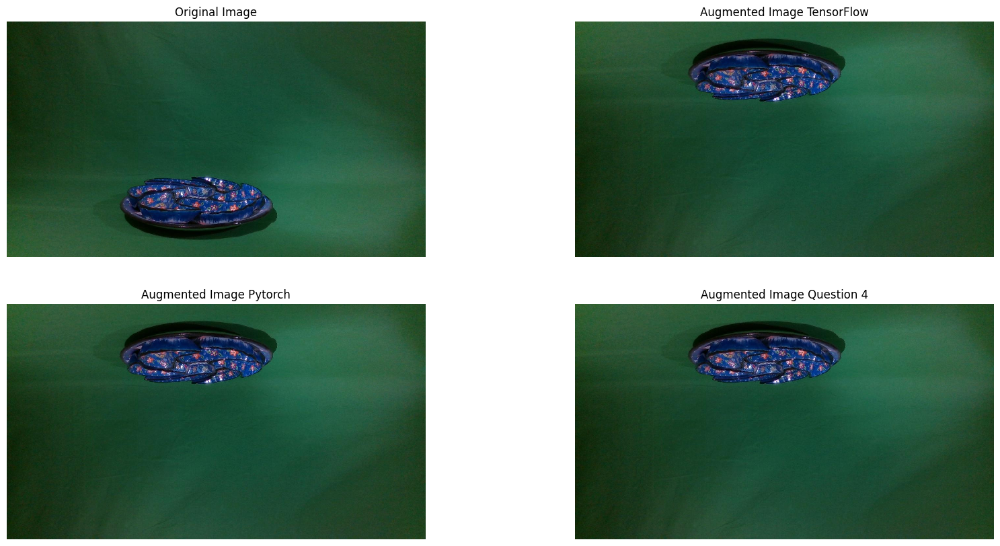

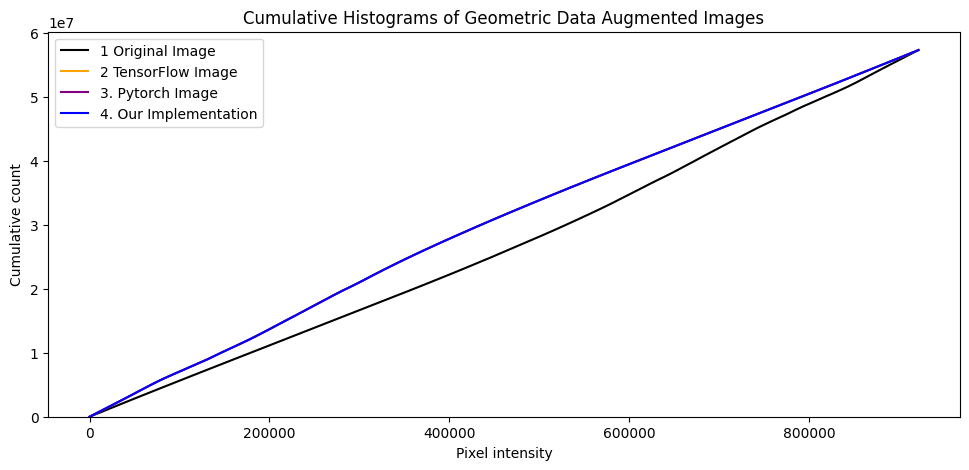

In [9]:
DisplayImages(FlippedImages,2,2)
cumulativeHistogramGeometric(FlippedImages)

In [10]:
outputMSE(FlippedImages,comparativeList)
outputSSIM(FlippedImages,comparativeList)


MSE of  Augmented Image Question 4  vs  Original Image : Red Channel: 86.167
MSE of  Augmented Image Question 4  vs  Original Image : Green Channel: 92.81
MSE of  Augmented Image Question 4  vs  Original Image : Blue Channel: 75.259
MSE of  Augmented Image Question 4  vs  Original Image : Average Channel: 84.746

MSE of  Augmented Image Question 4  vs  Augmented Image Pytorch : Red Channel: 0.313
MSE of  Augmented Image Question 4  vs  Augmented Image Pytorch : Green Channel: 0.148
MSE of  Augmented Image Question 4  vs  Augmented Image Pytorch : Blue Channel: 0.277
MSE of  Augmented Image Question 4  vs  Augmented Image Pytorch : Average Channel: 0.246

MSE of  Augmented Image Question 4  vs  Augmented Image TensorFlow : Red Channel: 0.313
MSE of  Augmented Image Question 4  vs  Augmented Image TensorFlow : Green Channel: 0.148
MSE of  Augmented Image Question 4  vs  Augmented Image TensorFlow : Blue Channel: 0.277
MSE of  Augmented Image Question 4  vs  Augmented Image TensorFlow : 

### Rotations

In [11]:
RotatedImages = {"Original Image": mainImage,
          "Augmented Image TensorFlow":cv2.cvtColor(cv2.imread(pathNamepart3Tensorflow+"GeometricAugmentation/Rotations/Item_3_Rotation Image_1.jpeg"), cv2.COLOR_BGR2RGB),
          "Augmented Image Pytorch": cv2.cvtColor(cv2.imread(pathNamepart3Pytorch+"GeometricAugmentation/Rotations/Item_3_Rotation Image_1.jpeg"), cv2.COLOR_BGR2RGB),
          "Augmented Image Question 4": cv2.cvtColor(cv2.imread(pathNamepart4+"GeometricAugmentation/Rotations/Rotation -30 degrees bosnia_colour.jpeg"), cv2.COLOR_BGR2RGB)}

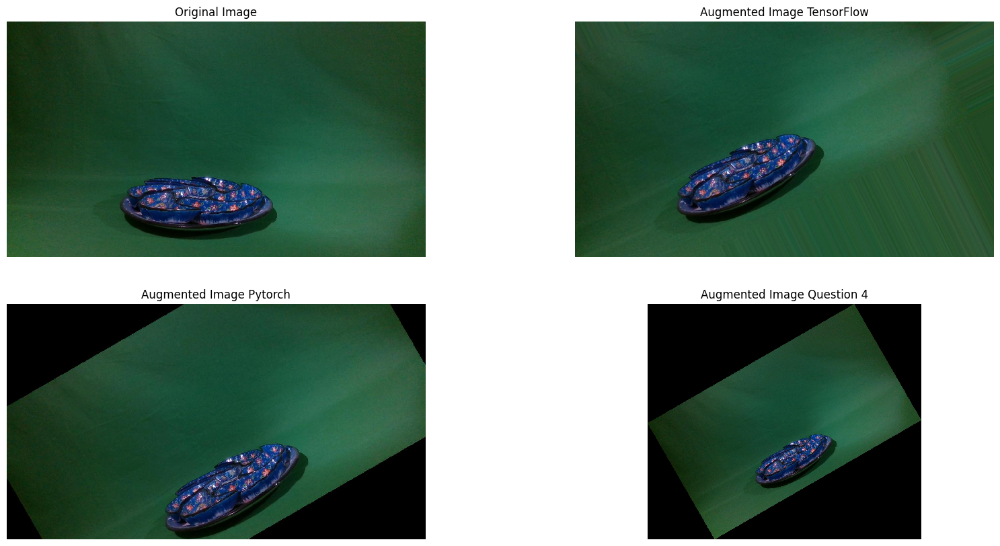

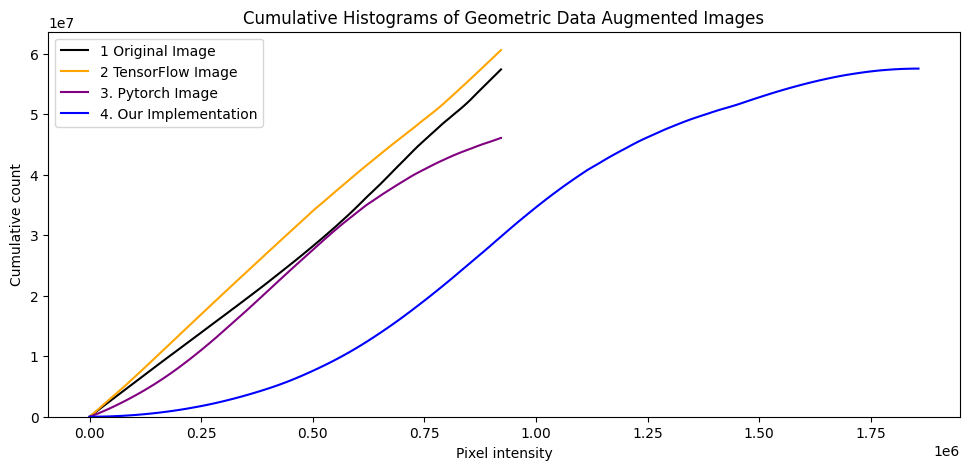

In [12]:
DisplayImages(RotatedImages,2,2)
cumulativeHistogramGeometric(RotatedImages)

In [13]:
outputMSE(RotatedImages,comparativeList)
outputSSIM(RotatedImages,comparativeList)


MSE of  Augmented Image Question 4  vs  Original Image : Red Channel: 96.317
MSE of  Augmented Image Question 4  vs  Original Image : Green Channel: 92.137
MSE of  Augmented Image Question 4  vs  Original Image : Blue Channel: 90.075
MSE of  Augmented Image Question 4  vs  Original Image : Average Channel: 92.843

MSE of  Augmented Image Question 4  vs  Augmented Image Pytorch : Red Channel: 62.618
MSE of  Augmented Image Question 4  vs  Augmented Image Pytorch : Green Channel: 63.768
MSE of  Augmented Image Question 4  vs  Augmented Image Pytorch : Blue Channel: 56.515
MSE of  Augmented Image Question 4  vs  Augmented Image Pytorch : Average Channel: 60.967

MSE of  Augmented Image Question 4  vs  Augmented Image TensorFlow : Red Channel: 106.726
MSE of  Augmented Image Question 4  vs  Augmented Image TensorFlow : Green Channel: 106.568
MSE of  Augmented Image Question 4  vs  Augmented Image TensorFlow : Blue Channel: 97.729
MSE of  Augmented Image Question 4  vs  Augmented Image Ten

### Shearing

In [35]:
ShearedImages = {"Original Image": mainImage,
          "Augmented Image TensorFlow":cv2.cvtColor(cv2.imread(pathNamepart3Tensorflow+"GeometricAugmentation/Shearing/Item_3_Shear Image_2.jpeg"), cv2.COLOR_BGR2RGB),
          "Augmented Image Pytorch": cv2.cvtColor(cv2.imread(pathNamepart3Pytorch+"GeometricAugmentation/Shearing/Item_3_Shear Image_1.jpeg"), cv2.COLOR_BGR2RGB),
          "Augmented Image Question 4": cv2.cvtColor(cv2.imread(pathNamepart4+"GeometricAugmentation/Shearing/Shearing 0 by a factor of 2.5 bosnia_colour.jpeg"), cv2.COLOR_BGR2RGB)}

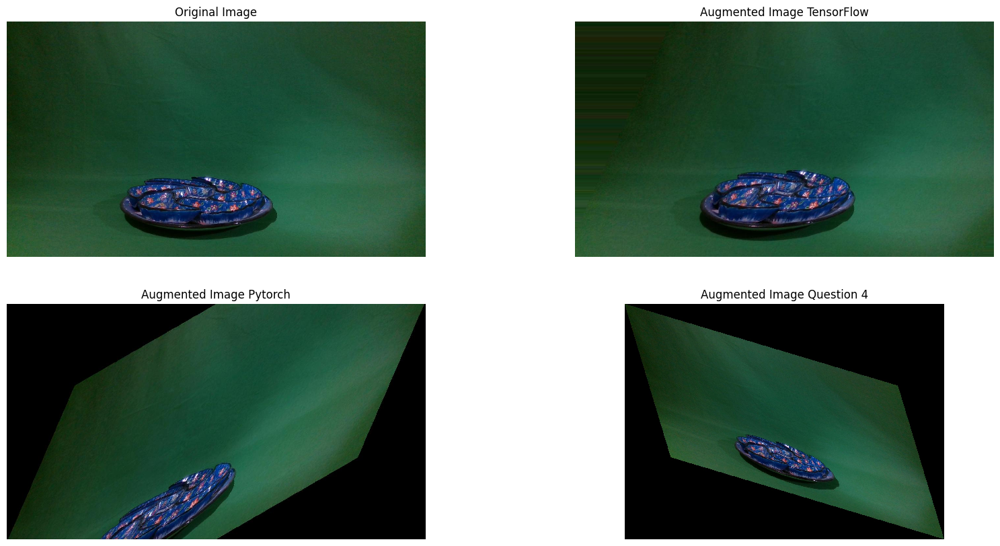

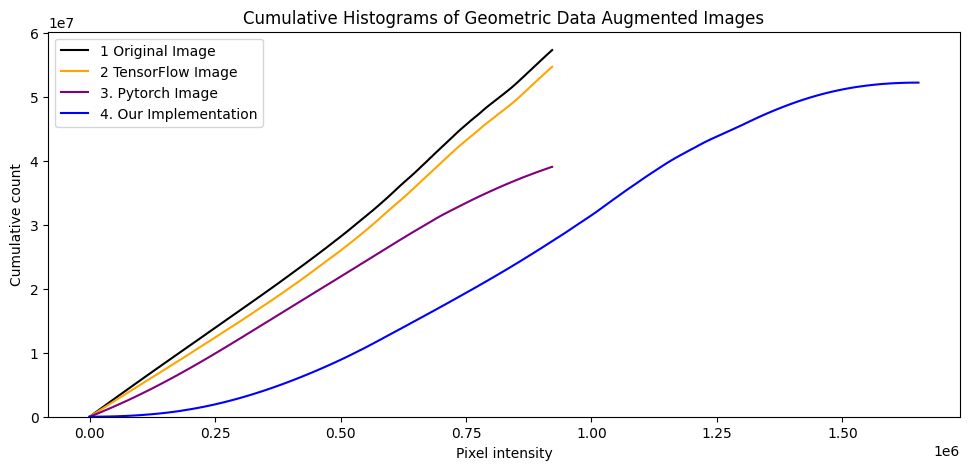

In [36]:
DisplayImages(ShearedImages,2,2)
cumulativeHistogramGeometric(ShearedImages)

In [37]:
outputMSE(ShearedImages,comparativeList)
outputSSIM(ShearedImages,comparativeList)


MSE of  Augmented Image Question 4  vs  Original Image : Red Channel: 87.222
MSE of  Augmented Image Question 4  vs  Original Image : Green Channel: 84.47
MSE of  Augmented Image Question 4  vs  Original Image : Blue Channel: 79.586
MSE of  Augmented Image Question 4  vs  Original Image : Average Channel: 83.759

MSE of  Augmented Image Question 4  vs  Augmented Image Pytorch : Red Channel: 82.482
MSE of  Augmented Image Question 4  vs  Augmented Image Pytorch : Green Channel: 83.515
MSE of  Augmented Image Question 4  vs  Augmented Image Pytorch : Blue Channel: 77.882
MSE of  Augmented Image Question 4  vs  Augmented Image Pytorch : Average Channel: 81.293

MSE of  Augmented Image Question 4  vs  Augmented Image TensorFlow : Red Channel: 101.089
MSE of  Augmented Image Question 4  vs  Augmented Image TensorFlow : Green Channel: 103.002
MSE of  Augmented Image Question 4  vs  Augmented Image TensorFlow : Blue Channel: 86.204
MSE of  Augmented Image Question 4  vs  Augmented Image Tens

### Translation

In [17]:
TranslationImages = {"Original Image": mainImage,
          "Augmented Image TensorFlow":cv2.cvtColor(cv2.imread(pathNamepart3Tensorflow+"GeometricAugmentation/Translation/Item_3_Translation Image_2.jpeg"), cv2.COLOR_BGR2RGB),
          "Augmented Image Pytorch": cv2.cvtColor(cv2.imread(pathNamepart3Pytorch+"GeometricAugmentation/Translation/Item_3_Translation Image_2.jpeg"), cv2.COLOR_BGR2RGB),
          "Augmented Image Question 4": cv2.cvtColor(cv2.imread(pathNamepart4+"GeometricAugmentation/Translation/Translation 1 bosnia_colour.jpeg"), cv2.COLOR_BGR2RGB)}

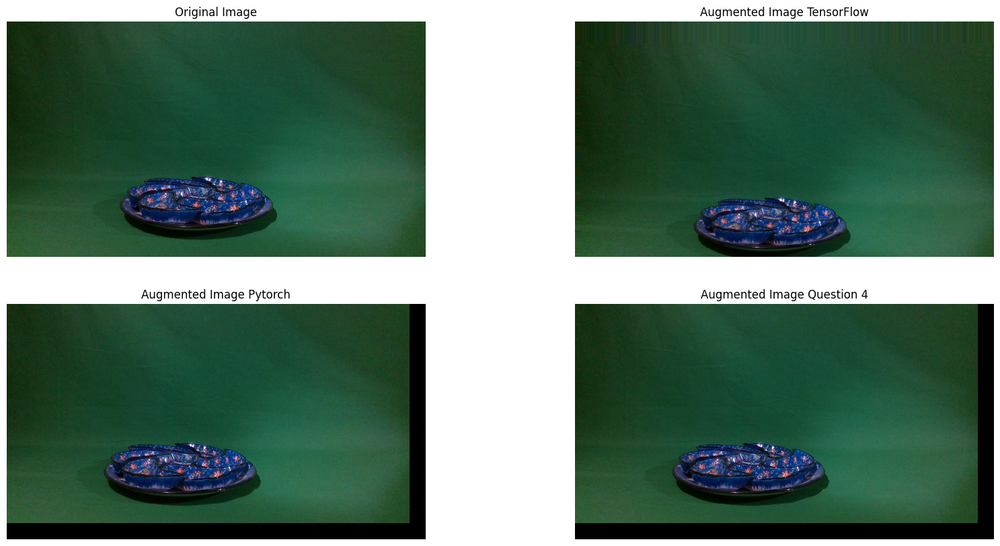

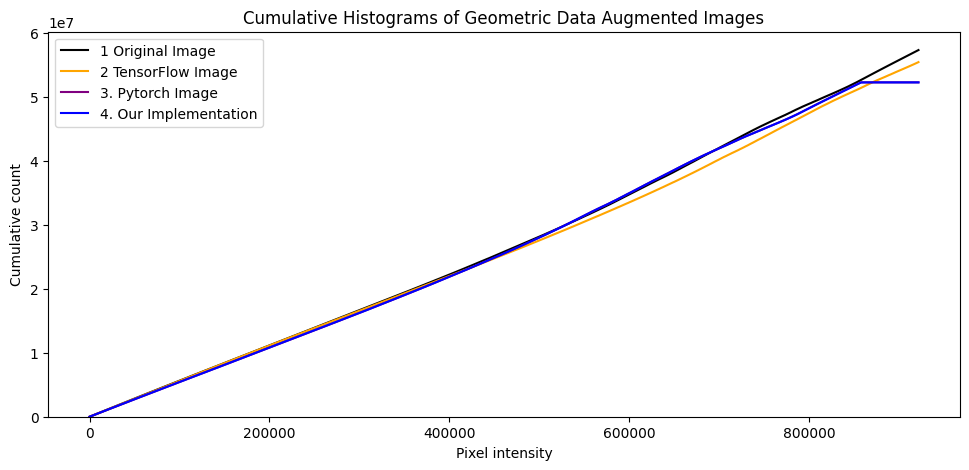

In [18]:
DisplayImages(TranslationImages,2,2)
cumulativeHistogramGeometric(TranslationImages)

In [19]:
outputMSE(TranslationImages,comparativeList)
outputSSIM(TranslationImages,comparativeList)


MSE of  Augmented Image Question 4  vs  Original Image : Red Channel: 55.442
MSE of  Augmented Image Question 4  vs  Original Image : Green Channel: 52.385
MSE of  Augmented Image Question 4  vs  Original Image : Blue Channel: 49.865
MSE of  Augmented Image Question 4  vs  Original Image : Average Channel: 52.564

MSE of  Augmented Image Question 4  vs  Augmented Image Pytorch : Red Channel: 4.717
MSE of  Augmented Image Question 4  vs  Augmented Image Pytorch : Green Channel: 3.411
MSE of  Augmented Image Question 4  vs  Augmented Image Pytorch : Blue Channel: 4.451
MSE of  Augmented Image Question 4  vs  Augmented Image Pytorch : Average Channel: 4.193

MSE of  Augmented Image Question 4  vs  Augmented Image TensorFlow : Red Channel: 67.305
MSE of  Augmented Image Question 4  vs  Augmented Image TensorFlow : Green Channel: 67.478
MSE of  Augmented Image Question 4  vs  Augmented Image TensorFlow : Blue Channel: 65.43
MSE of  Augmented Image Question 4  vs  Augmented Image TensorFlow

## Photometric Augmentation

### Brightness

In [20]:
BrightenedImages = {"Original Image": mainImage,
          "Augmented Image TensorFlow":cv2.cvtColor(cv2.imread(pathNamepart3Tensorflow+"PhotometricAugmentation/Brightness/Item_3_Brightness Image_4.jpeg"), cv2.COLOR_BGR2RGB),
          "Augmented Image Pytorch": cv2.cvtColor(cv2.imread(pathNamepart3Pytorch+"PhotometricAugmentation/Brightness/Item_3_Brightness Image_4.jpeg"), cv2.COLOR_BGR2RGB),
          "Augmented Image Question 4": cv2.cvtColor(cv2.imread(pathNamepart4+"PhotometricAugmentation/BrightnessVariation/Brightened 3 bosnia_colour.jpeg"), cv2.COLOR_BGR2RGB)}

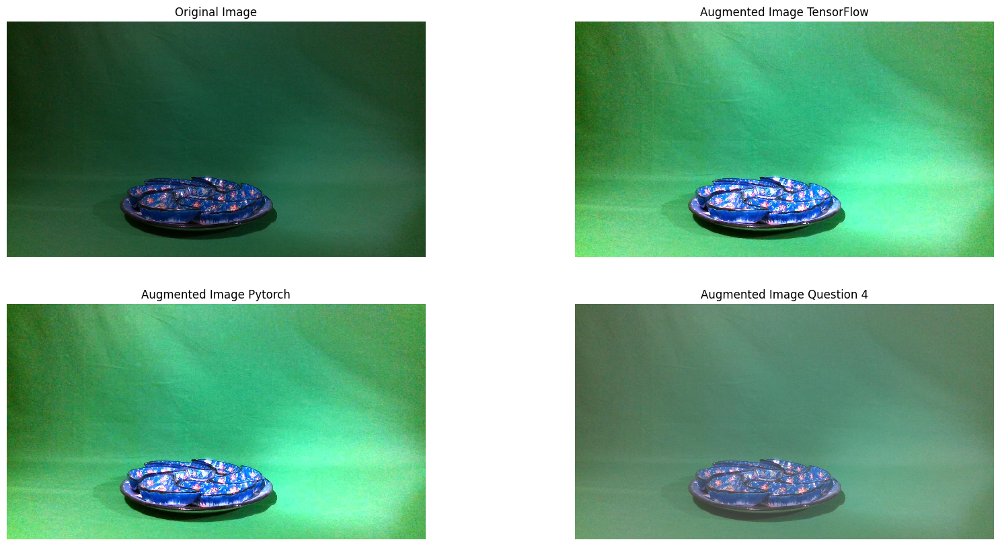

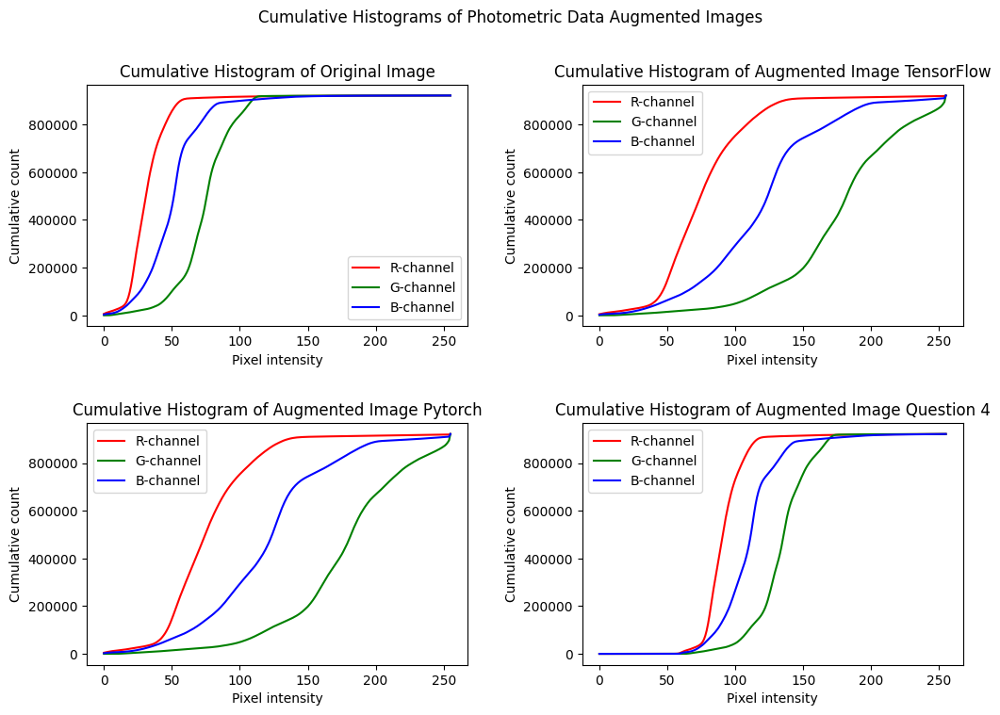

In [21]:
DisplayImages(BrightenedImages,2,2)
cumulativeHistogramPhotometric(BrightenedImages)

In [22]:
outputMSE(BrightenedImages,comparativeList)
outputSSIM(BrightenedImages,comparativeList)


MSE of  Augmented Image Question 4  vs  Original Image : Red Channel: 25.779
MSE of  Augmented Image Question 4  vs  Original Image : Green Channel: 31.021
MSE of  Augmented Image Question 4  vs  Original Image : Blue Channel: 29.439
MSE of  Augmented Image Question 4  vs  Original Image : Average Channel: 28.746

MSE of  Augmented Image Question 4  vs  Augmented Image Pytorch : Red Channel: 99.003
MSE of  Augmented Image Question 4  vs  Augmented Image Pytorch : Green Channel: 113.206
MSE of  Augmented Image Question 4  vs  Augmented Image Pytorch : Blue Channel: 98.622
MSE of  Augmented Image Question 4  vs  Augmented Image Pytorch : Average Channel: 103.611

MSE of  Augmented Image Question 4  vs  Augmented Image TensorFlow : Red Channel: 99.003
MSE of  Augmented Image Question 4  vs  Augmented Image TensorFlow : Green Channel: 113.206
MSE of  Augmented Image Question 4  vs  Augmented Image TensorFlow : Blue Channel: 98.622
MSE of  Augmented Image Question 4  vs  Augmented Image Te

### Constrast

In [23]:
ContrastedImages = {"Original Image": mainImage,
          "Augmented Image TensorFlow":cv2.cvtColor(cv2.imread(pathNamepart3Tensorflow+"PhotometricAugmentation/Contrast/Item_3_Contrast Image_3.jpeg"), cv2.COLOR_BGR2RGB),
          "Augmented Image Pytorch": cv2.cvtColor(cv2.imread(pathNamepart3Pytorch+"PhotometricAugmentation/Contrast/Item_3_Contrast Image_3.jpeg"), cv2.COLOR_BGR2RGB),
          "Augmented Image Question 4": cv2.cvtColor(cv2.imread(pathNamepart4+"PhotometricAugmentation/ContrastVariation/Contrasted 2 bosnia_colour.jpeg"), cv2.COLOR_BGR2RGB)}

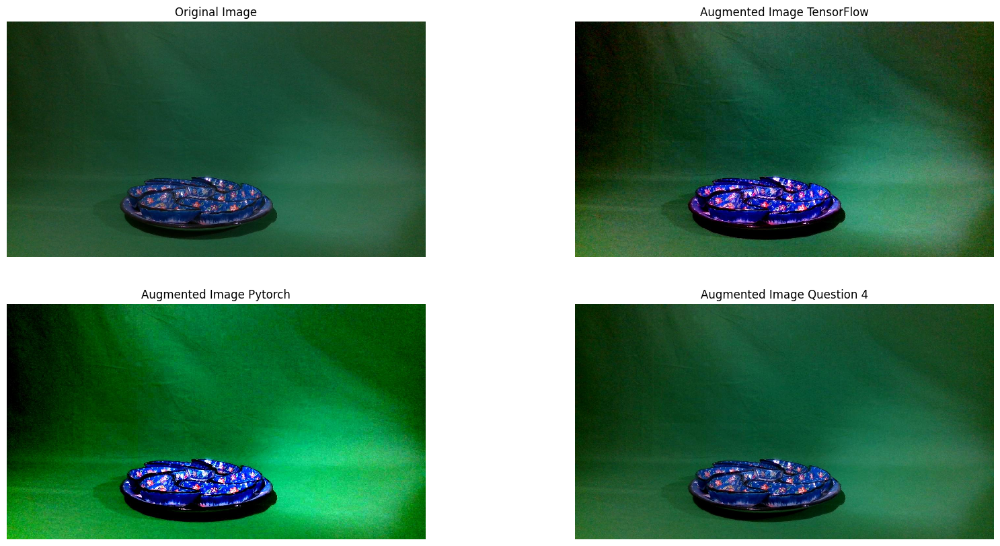

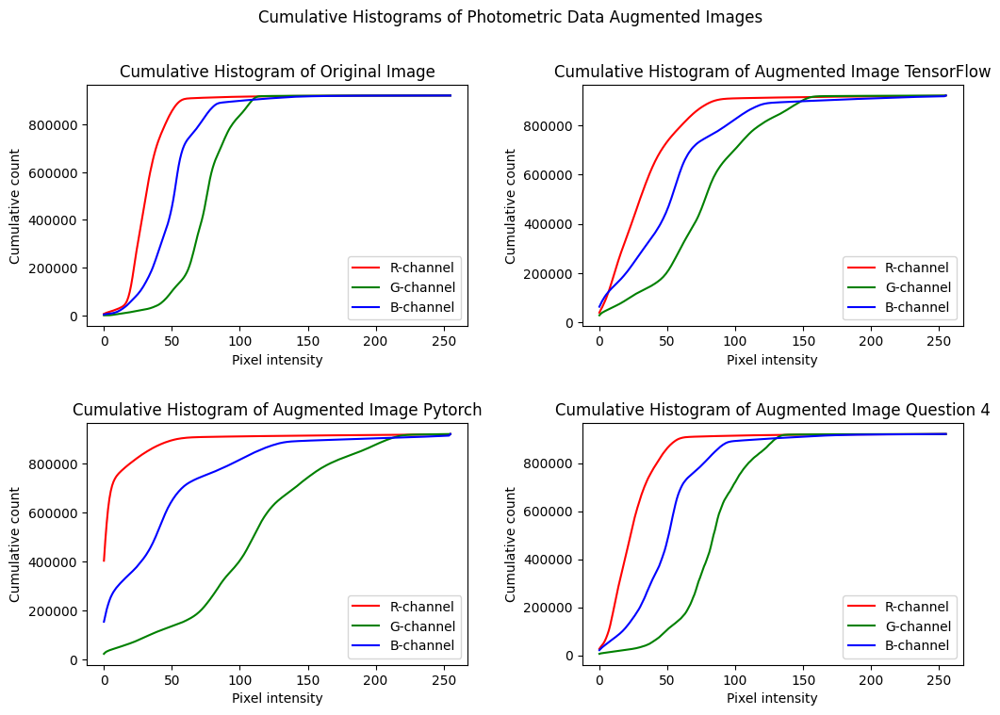

In [24]:
DisplayImages(ContrastedImages,2,2)
cumulativeHistogramPhotometric(ContrastedImages)

In [25]:
outputMSE(ContrastedImages,comparativeList)
outputSSIM(ContrastedImages,comparativeList)


MSE of  Augmented Image Question 4  vs  Original Image : Red Channel: 38.534
MSE of  Augmented Image Question 4  vs  Original Image : Green Channel: 71.299
MSE of  Augmented Image Question 4  vs  Original Image : Blue Channel: 73.409
MSE of  Augmented Image Question 4  vs  Original Image : Average Channel: 61.08

MSE of  Augmented Image Question 4  vs  Augmented Image Pytorch : Red Channel: 96.618
MSE of  Augmented Image Question 4  vs  Augmented Image Pytorch : Green Channel: 105.783
MSE of  Augmented Image Question 4  vs  Augmented Image Pytorch : Blue Channel: 99.508
MSE of  Augmented Image Question 4  vs  Augmented Image Pytorch : Average Channel: 100.637

MSE of  Augmented Image Question 4  vs  Augmented Image TensorFlow : Red Channel: 60.153
MSE of  Augmented Image Question 4  vs  Augmented Image TensorFlow : Green Channel: 78.949
MSE of  Augmented Image Question 4  vs  Augmented Image TensorFlow : Blue Channel: 56.799
MSE of  Augmented Image Question 4  vs  Augmented Image Tens

### Saturation

In [26]:
SaturatedImages = {"Original Image": mainImage,
          "Augmented Image TensorFlow":cv2.cvtColor(cv2.imread(pathNamepart3Tensorflow+"PhotometricAugmentation/Saturation/Item_3_Saturation Image_2.jpeg"), cv2.COLOR_BGR2RGB),
          "Augmented Image Pytorch": cv2.cvtColor(cv2.imread(pathNamepart3Pytorch+"PhotometricAugmentation/Saturation/Item_3_Saturation Image_2.jpeg"), cv2.COLOR_BGR2RGB),
          "Augmented Image Question 4": cv2.cvtColor(cv2.imread(pathNamepart4+"PhotometricAugmentation/Saturation/Saturation Adjustments 1 bosnia_colour.jpeg"), cv2.COLOR_BGR2RGB)}

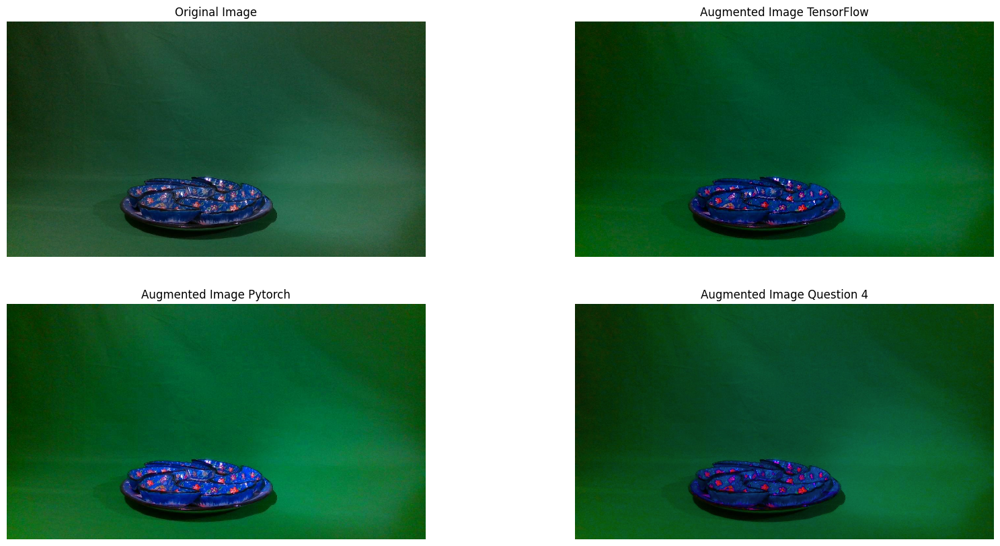

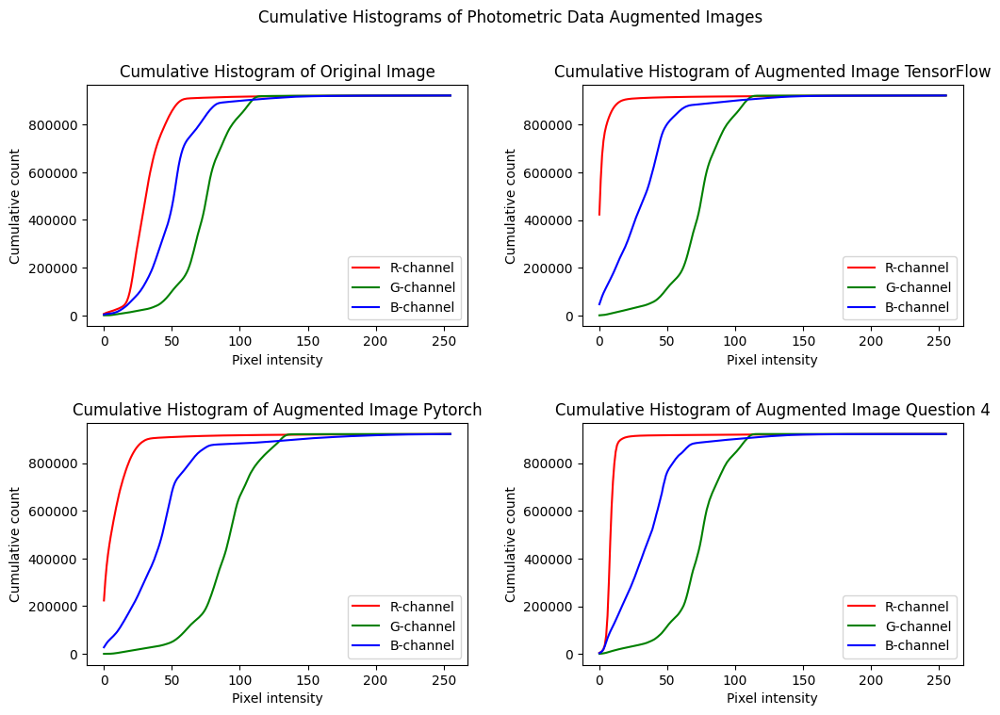

In [27]:
DisplayImages(SaturatedImages,2,2)
cumulativeHistogramPhotometric(SaturatedImages)

In [28]:
outputMSE(SaturatedImages,comparativeList)
outputSSIM(SaturatedImages,comparativeList)


MSE of  Augmented Image Question 4  vs  Original Image : Red Channel: 97.749
MSE of  Augmented Image Question 4  vs  Original Image : Green Channel: 5.47
MSE of  Augmented Image Question 4  vs  Original Image : Blue Channel: 114.602
MSE of  Augmented Image Question 4  vs  Original Image : Average Channel: 72.607

MSE of  Augmented Image Question 4  vs  Augmented Image Pytorch : Red Channel: 44.477
MSE of  Augmented Image Question 4  vs  Augmented Image Pytorch : Green Channel: 112.848
MSE of  Augmented Image Question 4  vs  Augmented Image Pytorch : Blue Channel: 48.923
MSE of  Augmented Image Question 4  vs  Augmented Image Pytorch : Average Channel: 68.75

MSE of  Augmented Image Question 4  vs  Augmented Image TensorFlow : Red Channel: 26.652
MSE of  Augmented Image Question 4  vs  Augmented Image TensorFlow : Green Channel: 4.954
MSE of  Augmented Image Question 4  vs  Augmented Image TensorFlow : Blue Channel: 53.222
MSE of  Augmented Image Question 4  vs  Augmented Image TensorF